#Histogram equalization for multichannel images

We use histogram equalization to enhance images that are too dark or bright by making dark regions darker and bright regions brighter, in other words, by increasing the contrast. 

In 8-bit color/grayscale images, each pixel has a value in the interval $[0, 256)$. When calculating histogram of an image, each pixel's value is grouped into bins of intensity values, which are 256 possible colors. Hence, pixel frequency of each possible color is counted.

Histograms of images that are too dark are concentrated to lower intensity values (left side of the histogram) whereas images that are too bright are concentrated to higher intensity values (right side of the histogram). Histogram equalization stretches these concentrated histogram curves towards pixel values with lower frequency, so that the whole domain of possible color values is used and utilized. This will result in a much better contrast on the image.

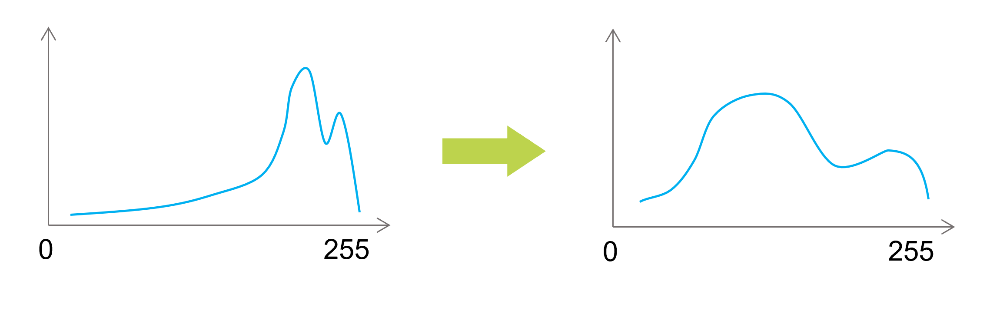

However histogram equalization is only applicable to single-channel images. Equalizing each color channel separately on a multichannel RGB image will not yield healthy results and most likely will disturb the color space of the image, since equalization calculation is based on the intensity values of the actual image, not just the color components.

To equalize multichannel images, they must be converted from RGB to another color space that separates intensity values from color components. Then the equalization must be performed based on this single intensity channel.

Some examples to these color spaces are:

*   **HSL:**(hue, saturation, lightness)
*   **HSV:**(hue, saturation, value)
*   **HSI:** (hue, saturation, intensity)
*   **YCbCr/Y'CbCr or Y'UV/YUV:** (luma/luminance, blue and red  projection/chrominance/difference chroma)


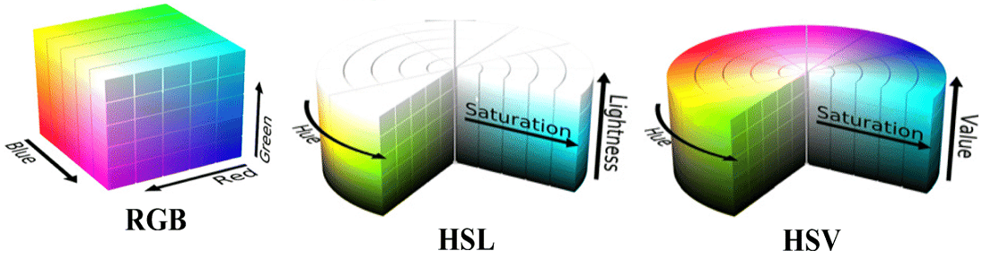

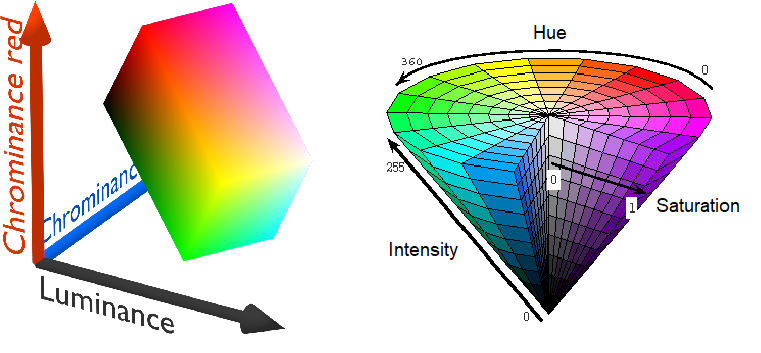

## Color space conversion

Let's import the sample image to be equalized, which is an multichannel RGB image.

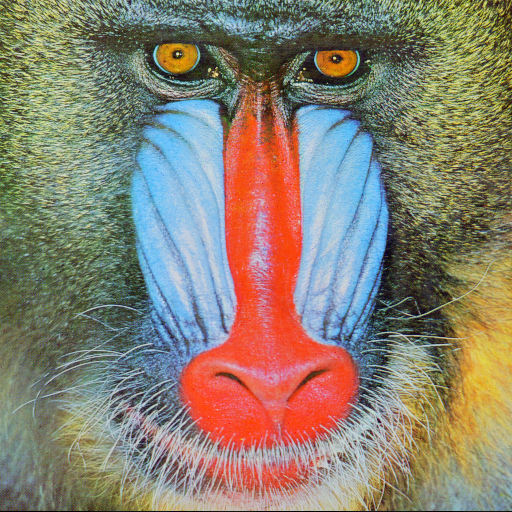

In [281]:
import cv2 as cv
import sys
from google.colab.patches import cv2_imshow

img = cv.imread("./mandrill.ppm")
assert (img is not None), "An error occured while reading the image!"

cv2_imshow(img)

### RGB to HSI

To perform a RGB to HSI conversion firstly the color values must be normalized.
$$
R_n=\frac{R}{R+G+B} \quad G_n=\frac{G}{R+G+B} \quad B_n=\frac{B}{R+G+B}
$$

Then the conversion is carried out as follows:

$$
I_n=\frac{R+G+B}{3\cdot 255} \\
\theta=\frac{0.5 ̇\cdot [(R_n-G_n)+(R_n-B_n)]}{\sqrt{(R_n-G_n)^2+(R_n-B_n)(G_n-B_n)}}\\
S_n=1-3\cdot min\{R_n,G_n,B_n\}\\
H_n=\left\{ \begin{array}{lr} cos^{-1}\theta,& \text{if } G_n\ge B_n \\ 2\pi- cos^{-1}\theta,&\text{if } B_n \gt G_n\end{array} \right\}\\
$$

Finally, the hue, saturation and intensity values are converted to ranges $[0, 360]$, $[0, 100]$ and $[0, 255]$ respectively.

$$
H=H_n\frac{180}{\pi}\quad S=S_n\cdot100\quad I=I_n\cdot255
$$

### HSI to RGB
To perform a RGB to HSI conversion firstly the hue, saturation and intensity values must be normalized.

$$
H_n=H\frac{\pi}{180}\quad S_n=\frac{S}{100}\quad I_n=\frac{I}{255}
$$

Then the conversion is carried out as follows:
$$
\alpha = I_n \cdot (1 - S_n) \\
\beta = I_n \cdot \left[ 1 + \frac{S_n \cdot cos(H_n)}{cos\left(\frac{\pi}{3}-H_n\right)} \right] \\
\gamma = 3I_n - (\alpha + \beta)\\
$$

$$
\left(R_n,G_n,B_n\right) = 
\left\{ \begin{array}{lr}
(\beta, \gamma, \alpha),&\text{if } H_n\lt\frac{2\pi}{3}\\
(\alpha, \beta, \gamma) & \text{s.t. } H_n:=H_n-\frac{2\pi}{3},&\text{if } \frac{2\pi}{3}\le H_n\lt\frac{4\pi}{3}\\
(\gamma, \alpha, \beta) & \text{s.t. } H_n:=H_n-\frac{4\pi}{3},&\text{if } \frac{4\pi}{3}\le H_n\lt2\pi\\
\end{array}\right\} 
$$

Finally the normalized color values are converted to the RGB color range $[0, 255]$.

$$
R=R_n\cdot255 \quad G=G_n\cdot255 \quad B=B_n\cdot255 
$$

In [282]:
from math import sqrt, acos, cos, pi, floor

def ColorRGB2HSI(r, g, b):
  r, g, b = int(r), int(g), int(b)

  epsilon_rgb = 0 if (r+g+b) != 0 else 0.0001
  r_n, g_n, b_n = r/(r+g+b+epsilon_rgb), g/(r+g+b+epsilon_rgb), b/(r+g+b+epsilon_rgb)

  m = min([r_n, g_n, b_n])
  i = (r+g+b)/(3*255)

  denum=(sqrt((r_n-g_n)**2+(r_n-b_n)*(g_n-b_n)))
  epsilon_theta = 0 if denum != 0 else 0.0001
  theta = (0.5*((r_n-g_n)+(r_n-b_n)))/(denum+epsilon_theta)
  h = acos(theta) if b_n <= g_n else 2*pi - acos(theta)

  s = 1 - 3*m
  h, s, i = h*(180/pi), s*100, i*255

  return h, s, i

#calculate alpha beta and gamma (x y z here respectively)
def calc_xyz(h_n, s_n, i_n):
  x = i_n*(1-s_n)
  y = i_n*(1+((s_n*cos(h_n))/(cos(pi/3-h_n))))
  z = 3*i_n-(x+y)

  return x, y, z

def ColorHSI2RGB(h, s, i):
  h, s, i = float(h), float(s), float(i) #to convert np.uint8 to float
  h_n , s_n , i_n = h*(pi/180), s/100, i/255

  if(h_n < 2*pi/3): 
    x, y, z = calc_xyz(h_n, s_n, i_n)
    r_n, g_n, b_n = y, z, x
  elif(2*pi/3 <= h_n and h_n < 4*pi/3): 
    h_n = h_n - 2*pi/3
    x, y, z = calc_xyz(h_n, s_n, i_n)
    r_n, g_n, b_n = x, y, z
  elif(4*pi/3 <= h_n and h_n < 2*pi):
    h_n = h_n - 4*pi/3
    x, y, z = calc_xyz(h_n, s_n, i_n)
    r_n, g_n, b_n = z, x, y

  r, g, b = round(r_n*255), round(g_n*255), round(b_n*255)
  return r, g, b

In [290]:
import numpy as np

def ImageRGB2HSI(img):
  assert (img is not None), "An error occured while reading the image!"

  width, height, _ = img.shape
  new_img = img.astype(np.float64)

  assert (new_img is not None), "An error occured while copying the image!"

  for x in range(width):
    for y in range(height):
      rgb = [None, None, None]

      for k in range(3):
        rgb[k] = img[x][y][k]

      r, g, b = rgb #numpy.uint8
      h, s, i = ColorRGB2HSI(r, g, b)

      hsi = [h, s, i]
      for k in range(3):
        new_img[x][y][k] = hsi[k] #implicitly casted to numpy.uint8

  return new_img

def ImageHSI2RGB(img):
  assert (img is not None), "An error occured while reading the image!"

  width, height, _ = img.shape
  new_img = img.astype(np.uint8) 

  assert (new_img is not None), "An error occured while copying the image!"

  for x in range(width):
    for y in range(height):
      hsi = [None, None, None]

      for k in range(3):
        hsi[k] = img[x][y][k]

      h, s, i = hsi
      r, g, b = ColorHSI2RGB(h, s, i)
      rgb = [r, g, b]

      for k in range(3):
        new_img[x][y][k] = rgb[k]
  
  return new_img    

Original RGB image:


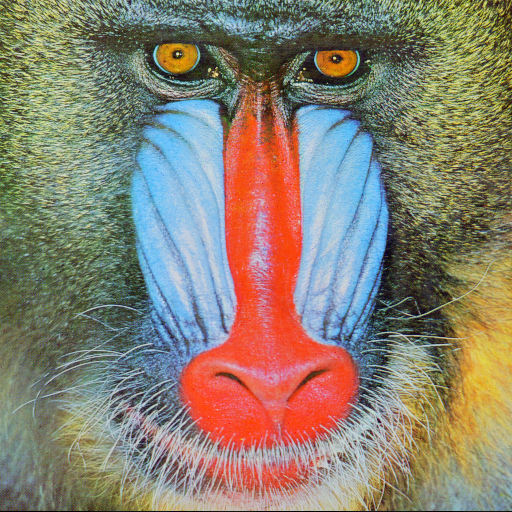

Converted HSI image:


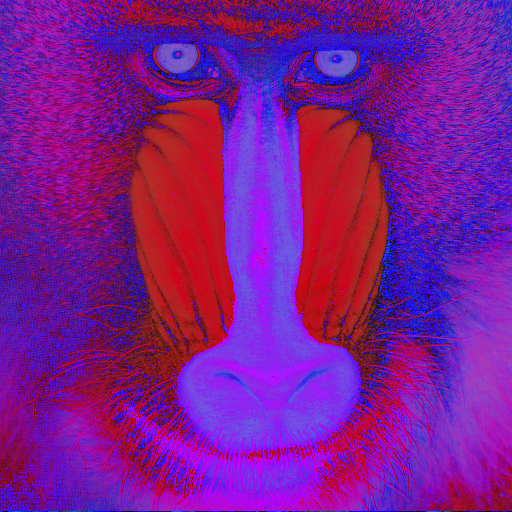

Converted RGB image:


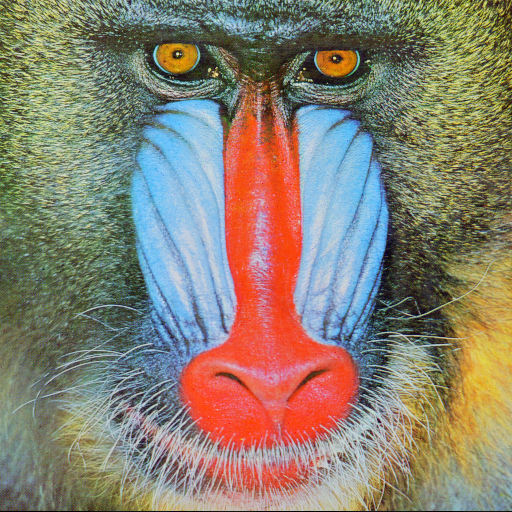

In [291]:
hsimg = ImageRGB2HSI(img)
bhsimg = ImageHSI2RGB(hsimg)

print("Original RGB image:")
cv2_imshow(img)
print("Converted HSI image:")
cv2_imshow(hsimg)
print("Converted RGB image:")
cv2_imshow(bhsimg)

### RGB to YCbCr and YCbCr to RGB
Similarly, built-in OpenCV2 functions can be used to convert images between RGB and YCbCr color spaces.

Original RGB image:


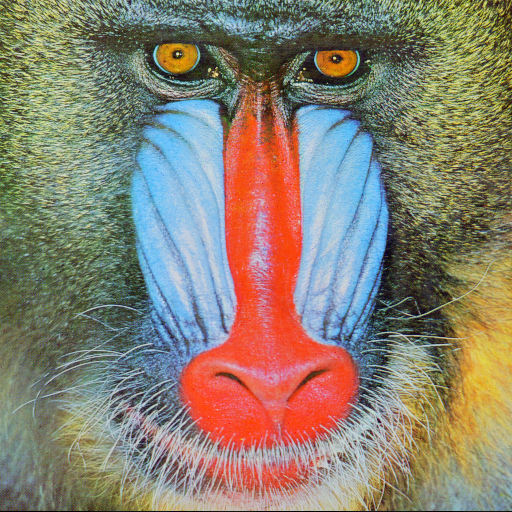

Converted YCbCr image:


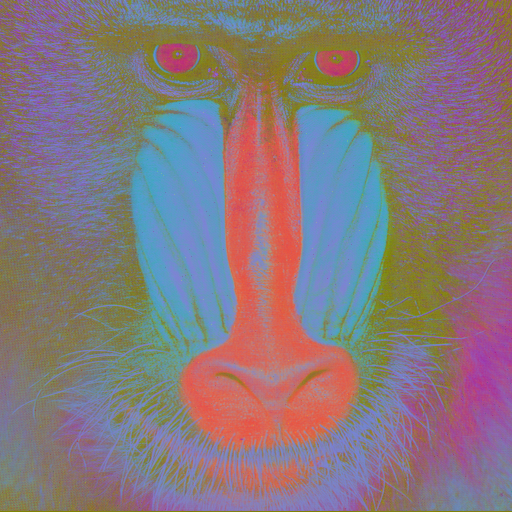

Converted RGB image:


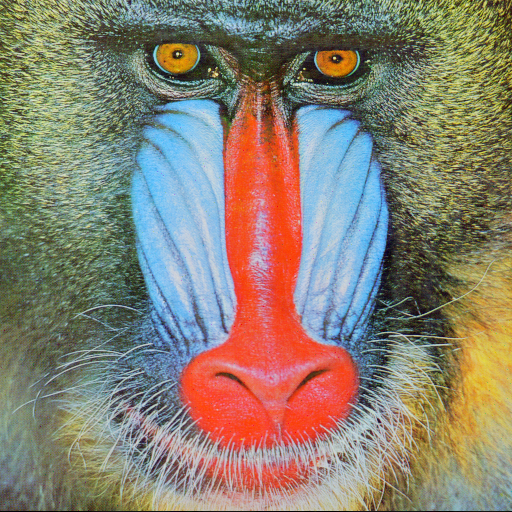

In [285]:
ycbcr = cv.cvtColor(img, cv.COLOR_RGB2YCrCb)
bycbcr = cv.cvtColor(ycbcr, cv.COLOR_YCrCb2RGB)

print("Original RGB image:")
cv2_imshow(img)
print("Converted YCbCr image:")
cv2_imshow(ycbcr)
print("Converted RGB image:")
cv2_imshow(bycbcr)

## Histogram equalization

Now that we converted our multichannel image into color spaces which represent brightness by a single channel, we can use this channel to perform histogram equalization in order to enhance the image contrast.

We firstly need to convert the image into the color space. Then we will extract the intensity channel, which is a matrix that contains intensity level for every pixel of the image. We will equalize this channel, then replace the images intensity channel with this new equalized channel. Finally, we will obtain the enhanced image by converting it back to RGB colorspace.


### HE with HSI colorspace

Normal RGB image:


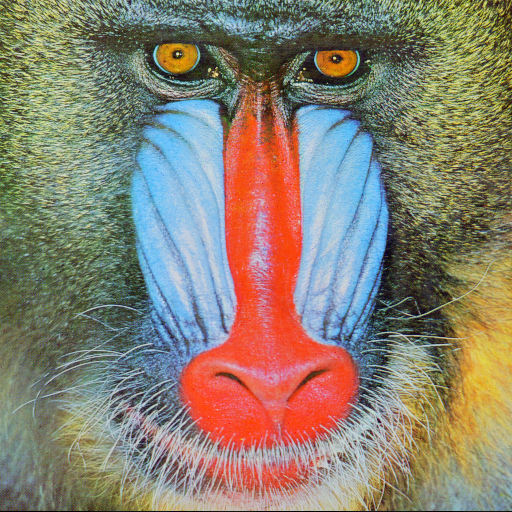

Normal intensity map:


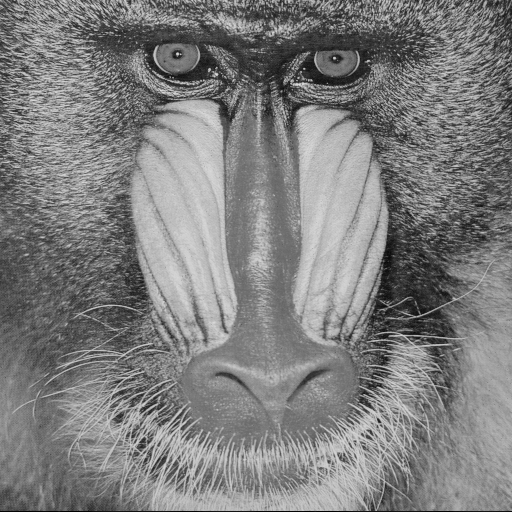

Equalized intensity map:


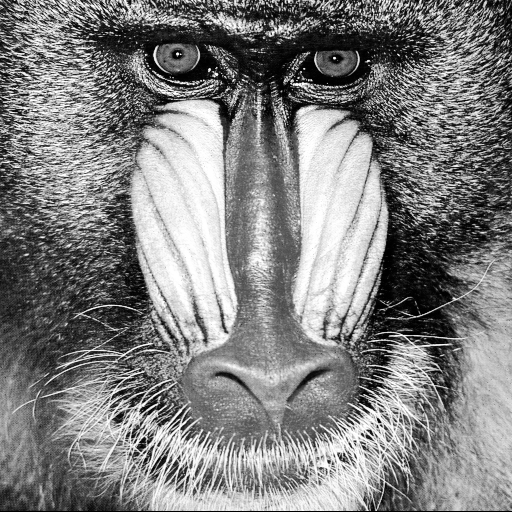

HSI-equalized RGB image:


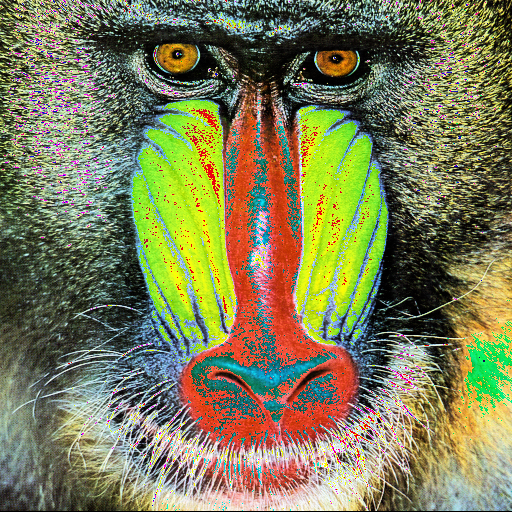

In [286]:
hsi_intensity_channel = hsimg[:,:,2].round().astype(np.uint8)
equalized_hsi_intensity_channel = cv.equalizeHist(hsi_intensity_channel)

equalized_hsi = hsimg.copy()
equalized_hsi[:,:,2] = equalized_hsi_intensity_channel

equalized_hsi_to_rgb = ImageHSI2RGB(equalized_hsi) 

print("Normal RGB image:")
cv2_imshow(img)
print("Normal intensity map:")
cv2_imshow(hsi_intensity_channel)
print("Equalized intensity map:")
cv2_imshow(equalized_hsi_intensity_channel)
print("HSI-equalized RGB image:")
cv2_imshow(equalized_hsi_to_rgb)


### HE with YCbCr colorspace

Normal RGB image:


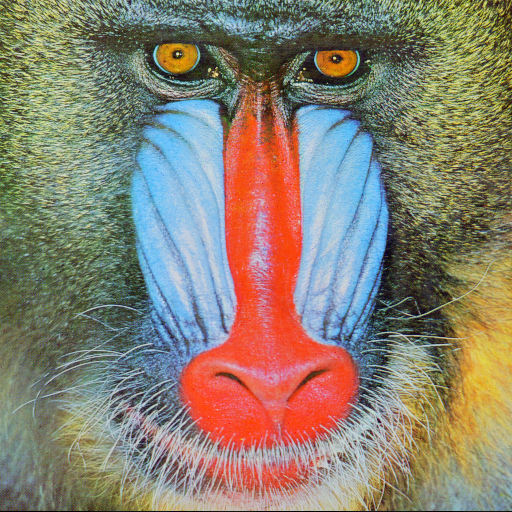

Normal intensity map:


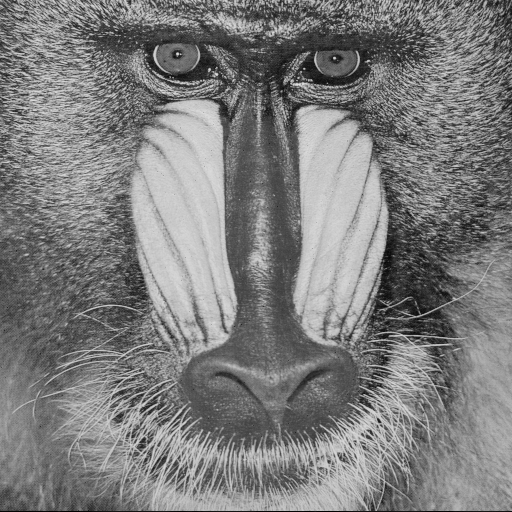

Equalized intensity map:


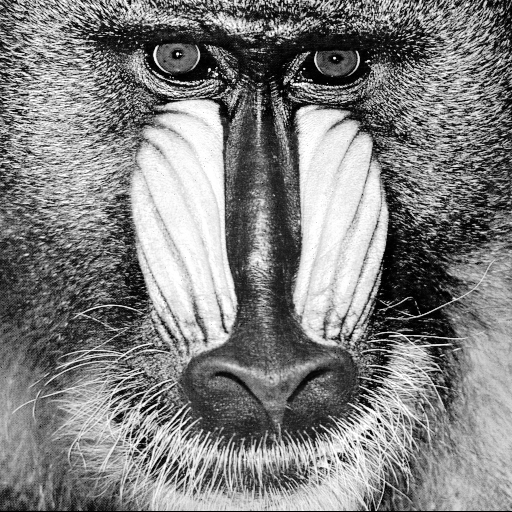

YCbCr-equalized RGB image:


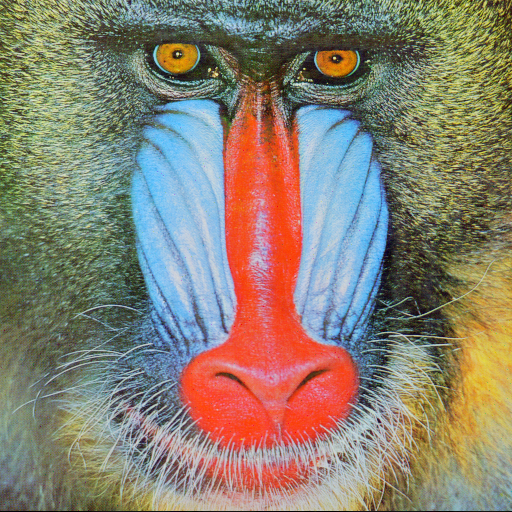

In [287]:
equalized_ycbcr = ycbcr.copy()
ycbcr_intensity_channel = ycbcr[:,:,0]
equalized_ycbcr_intensity_channel = cv.equalizeHist(ycbcr_intensity_channel)
equalized_ycbcr[:,:,0] = equalized_ycbcr_intensity_channel

equalized_ycbcr_to_rgb = cv.cvtColor(ycbcr, cv.COLOR_YCrCb2RGB)

print("Normal RGB image:")
cv2_imshow(img)
print("Normal intensity map:")
cv2_imshow(ycbcr_intensity_channel)
print("Equalized intensity map:")
cv2_imshow(equalized_ycbcr_intensity_channel)
print("YCbCr-equalized RGB image:")
cv2_imshow(equalized_ycbcr_to_rgb)


## PSNR comparison

To benchmark our results, we will use peak signal to noise ratios (PSNR). PSNR can be formulated as below:

$$
\text{PSNR}=20\times \log_{10}\left(\frac{255}{\sqrt{\varepsilon}}\right) \\
\varepsilon = \frac{1}{M\times N} \sum_{i=1}^{M} \sum_{i=1}^{N} \left[ \Xi_{\text{original}}(i, j) - \Xi_{\text{equalized}}(i, j)\right]^2 \\
$$

where $M$ and $N$ are width and height of the image respectively and $\varepsilon$ is the mean squared error between each pixel value $\Xi(i,j)$ of original and equalized image.

There is a built-in function in OpenCV for PSNR. Let's calculate PSNR value for each method, for every color channel.

In [288]:
from IPython.display import display, Markdown

hsi_rgb_channels = [equalized_hsi_to_rgb[:,:,i] for i in range(3)] #np.float
ycbcr_rgb_channels = [equalized_ycbcr_to_rgb[:,:,i] for i in range(3)] #np.uint8
img_rgb_channels = [img[:,:,i] for i in range(3)]

hsi_rgb_psnr = [cv.PSNR(hsi_rgb_channels[i], img_rgb_channels[i]) for i in range(3)]
ycbcr_rgb_psnr = [cv.PSNR(ycbcr_rgb_channels[i], img_rgb_channels[i]) for i in range(3)]

hsi_rgb_psnr_avg = sum(hsi_rgb_psnr)/3
ycbcr_rgb_psnr_avg = sum(ycbcr_rgb_psnr)/3

display(Markdown(f"""
| Channel | HSI histogram equalization PSNR | YCbCr histogram equalization PSNR |
| --- | --- | --- |
| R | {hsi_rgb_psnr[0]} | {ycbcr_rgb_psnr[0]} |
| G | {hsi_rgb_psnr[1]} | {ycbcr_rgb_psnr[1]} |
| B | {hsi_rgb_psnr[2]} | {ycbcr_rgb_psnr[2]} |
| Average | {hsi_rgb_psnr_avg} | {ycbcr_rgb_psnr_avg} |
"""))


| Channel | HSI histogram equalization PSNR | YCbCr histogram equalization PSNR |
| --- | --- | --- |
| R | 10.67378146082813 | 53.574574900969495 |
| G | 15.66966815532281 | 51.95466657007433 |
| B | 13.07384508523192 | 51.746202019065954 |
| Average | 13.139098233794286 | 52.42514783003659 |


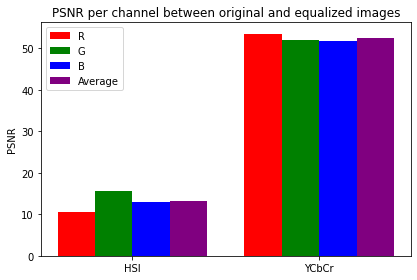

In [289]:
import matplotlib.pyplot as plt
import numpy as np

labels = ["HSI", "YCbCr"]

reds = [hsi_rgb_psnr[0], ycbcr_rgb_psnr[0]]
greens = [hsi_rgb_psnr[1], ycbcr_rgb_psnr[1]]
blues = [hsi_rgb_psnr[2], ycbcr_rgb_psnr[2]]
means = [hsi_rgb_psnr_avg, ycbcr_rgb_psnr_avg]

x = np.arange(len(labels))
width = 0.2

fig, ax = plt.subplots()
rects1 = ax.bar(x - 1.5*width, reds, width, label='R', color="red")
rects2 = ax.bar(x - 0.5*width, greens, width, label='G', color="green")
rects3 = ax.bar(x + 0.5*width, blues, width, label='B', color="blue")
rects4 = ax.bar(x + 1.5*width, means, width, label='Average',color="purple")

ax.set_ylabel('PSNR')
ax.set_title('PSNR per channel between original and equalized images')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

fig.tight_layout()
plt.show()


Higher PSNR generally indicates higher quality of reconstruction. Then we can conclude that YCbCr is much better colorspace conversion method for multichannel histogram equalization in comparison with HSI.